## Importing Libraries

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

In [ ]:
# Shows plots in jupyter notebook
%matplotlib inline

In [ ]:
# Set plot style
sns.set(color_codes=True)

## Loading data with Pandas

In [ ]:
training_values_df = pd.read_csv('Training Values.csv')
training_labels_df = pd.read_csv('Training labels.csv')

In [ ]:
training_values_df.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [ ]:
training_labels_df.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


## Descriptive statistics of data

### Data types

In [ ]:
training_values_df.info()
training_labels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55763 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59398 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

### The "Training Values" dataset consists of multiple features, including but not limited to:

id: Unique identifier for each pump.
amount_tsh: Total static head (the height that the water is being pumped).
date_recorded: The date the row was entered.
funder: Who funded the well.
gps_height: Altitude of the well.
installer: Organization that installed the well.
longitude and latitude: GPS coordinates.
wpt_name: Name of the waterpoint if it has one.
num_private: (Explanation not provided in the data snippet).
basin: Geographic water basin.
region: Geographic location.
population: Population around the well.
public_meeting: True/False.
scheme_management: Who operates the waterpoint.
permit: If the waterpoint is permitted.
construction_year: Year the waterpoint was constructed.
extraction_type, extraction_type_group, extraction_type_class: The kind of extraction the waterpoint uses.
management, management_group: How the waterpoint is managed.
payment, payment_type: What the water costs.
water_quality, quality_group: The quality of the water.
quantity, quantity_group: The quantity of water.
source, source_type, source_class: The source of the water.
waterpoint_type, waterpoint_type_group: The kind of waterpoint.

### The "Training Labels" dataset maps each id to a status_group, which indicates whether a pump is:

functional: The pump is operational.
functional needs repair: The pump is operational but needs repairs.
non functional: The pump is not operational.

The descriptive statistics for the numerical features of the combined dataset provide insights into several aspects of the data:

amount_tsh: The total static head (amount of water) varies widely, with a mean of approximately 317.65 but a maximum of 350,000, indicating significant outliers or variations in water availability.
gps_height: The altitude of the waterpoints has a wide range, from -90 to 2770 meters, with a mean of approximately 668.30 meters. This suggests varied geographical locations of waterpoints.
longitude and latitude: These coordinates show a reasonable spread across the geographical area, indicating the waterpoints are dispersed over a wide area.
num_private: This feature seems to have a lot of zeros, which suggests it might not be very informative for the majority of the data.
region_code and district_code: These are categorical features encoded as numbers, indicating different regions and districts where the waterpoints are located.
population: The population around the waterpoints varies significantly, with some having no population around them and others serving areas with up to 30,500 people.
construction_year: Many waterpoints have a construction year of 0, which likely indicates missing data. For those with recorded years, there's a wide range from old to more recently constructed waterpoints.

# Data processing

In [ ]:
combined_data = pd.merge(training_values_df, training_labels_df, on='id')
duplicates = combined_data.duplicated()
duplicates.any()

False

In [ ]:
for col in combined_data.columns:
    combined_data[col].replace(999,np.nan, inplace=True)

In [ ]:
# checking the variable types
def check_variable_types(df):
    variable_types = {
        'Numeric': [],
        'Categorical': [],
        'Boolean': [],
        'Date': [],
        'Text (Unique)': [],
        'Rejected': [],
        'Unsupported': []
    }

    text_types = [str, 'object']
    unsupported_types = ['category', 'timedelta64', 'period', 'interval']

    for column in df.columns:
        column_type = df[column].dtype

        if column_type in ['int64', 'float64']:
            variable_types['Numeric'].append(column)
        elif column_type in text_types:
            unique_ratio = df[column].nunique() / len(df)
            if unique_ratio > 0.5:
                variable_types['Text (Unique)'].append(column)
            else:
                variable_types['Categorical'].append(column)
        elif column_type == 'bool':
            variable_types['Boolean'].append(column)
        elif column_type == 'datetime64':
            variable_types['Date'].append(column)
        elif column_type in unsupported_types:
            variable_types['Unsupported'].append(column)
        else:
            variable_types['Rejected'].append(column)

    return variable_types

variable_types = check_variable_types(combined_data)


print("Variable Types Information:")
for category, columns in variable_types.items():
    if columns:
        print(f"{category}:")
        for column in columns:
            print(f"- {column}")
        print()

Variable Types Information:
Numeric:
- id
- amount_tsh
- gps_height
- longitude
- latitude
- num_private
- region_code
- district_code
- population
- construction_year

Categorical:
- date_recorded
- funder
- installer
- basin
- subvillage
- region
- lga
- ward
- public_meeting
- recorded_by
- scheme_management
- scheme_name
- permit
- extraction_type
- extraction_type_group
- extraction_type_class
- management
- management_group
- payment
- payment_type
- water_quality
- quality_group
- quantity
- quantity_group
- source
- source_type
- source_class
- waterpoint_type
- waterpoint_type_group
- status_group

Text (Unique):
- wpt_name



In [ ]:
def check_missing(df):
    missing = df.isna().sum()
    missing = missing[missing > 0]
    missing = missing.sort_values(ascending=False)
    return missing


missing_info = check_missing(combined_data)
num_variables = combined_data.shape[1]
num_observations = combined_data.shape[0]

print(f"Number of variables: {num_variables}")
print(f"Number of observations: {num_observations}")

print("\nMissing Values Information:")
for column, info in missing_info.items():
    print(f"Column '{column}':")
    print(info)

Number of variables: 41
Number of observations: 59400

Missing Values Information:
Column 'scheme_name':
28810
Column 'scheme_management':
3878
Column 'installer':
3655
Column 'funder':
3637
Column 'public_meeting':
3334
Column 'permit':
3056
Column 'subvillage':
371
Column 'gps_height':
19
Column 'wpt_name':
2
Column 'id':
1


In [ ]:
def calculate_memory_usage(df):
    total_memory_bytes = df.memory_usage(deep=True).sum()
    num_observations = df.shape[0]
    average_record_size_bytes = total_memory_bytes / num_observations
    total_memory_mib = total_memory_bytes / (1024 * 1024)

    return total_memory_mib, average_record_size_bytes

total_memory_mib, average_record_size_bytes = calculate_memory_usage(training_values_df)

print(f"\nTotal size in memory: {total_memory_mib:.2f} MiB")
print(f"Average record size in memory: {average_record_size_bytes:.2f} bytes")


Total size in memory: 112.00 MiB
Average record size in memory: 1977.20 bytes


# Checking unique values for each column
- This basically identifies categorical features in data, since no text labels were provided
- Experimenting with different thresholds to confirm

In [ ]:
count_uni = dict()
for col in combined_data.columns:
    # column to string to handle mixed types. This is safe for finding unique values for categoricals.
    unique_values = np.unique(combined_data[col].astype(str))
    count_uni[col] = len(unique_values)

list_cat = []
for key,val in count_uni.items():
    if count_uni[key]<10:
        list_cat.append(key)
        # print(f"{key}:{val}")

print(f"There are : {len(list_cat)} categotical fetures: {list_cat}")

There are : 17 categotical fetures: ['basin', 'public_meeting', 'recorded_by', 'permit', 'extraction_type_class', 'management_group', 'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'quantity_group', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group', 'status_group']


## Train test split

In [ ]:
# split the dataset into training and test sets, before pre-processing to avoid data leakage
from sklearn.model_selection import train_test_split


# for classification task
data_train, data_test = train_test_split(combined_data,test_size=.20,shuffle=True,stratify=combined_data['status_group'],random_state=0)

print(data_train.index)
# Lets rename our training data as df to avoid any confusion in subsequent stages
# From now nowards the training set will be df, and we have reserved `data_test` for evaluation
# df will be used for exploratory analysis only
df = data_train.copy()
df.drop('id',axis=1,inplace=True)

Index([27760, 15161, 37466, 50408, 42597, 22534, 25734, 19718, 32017, 27918,
       ...
       41293, 55415, 51864, 21156, 39528, 16330, 11379, 56981, 41010, 39431],
      dtype='int64', length=47520)


In [ ]:
# checking distribution (proportions of positive vs negative samples) of data by status_group
p_df = df['status_group'].value_counts()/sum(df['status_group'].value_counts())
p_test = data_test['status_group'].value_counts()/sum(data_test['status_group'].value_counts())

print(p_df)
print(df.shape)
print(p_test)
print(data_test.shape)

status_group
functional                 0.543077
non functional             0.384238
functional needs repair    0.072685
Name: count, dtype: float64
(47520, 40)
status_group
functional                 0.543098
non functional             0.384259
functional needs repair    0.072643
Name: count, dtype: float64
(11880, 41)


In [ ]:
import pandas as pd

# checking how many functional, non functional,and functional needs repair
target_distribution = df['status_group'].value_counts()

print("Class Distribution:")
print(target_distribution)

# the imbalance ratio
imbalance_ratio = target_distribution.min() / target_distribution.max()
print("Imbalance Ratio:", imbalance_ratio)


Class Distribution:
status_group
functional                 25807
non functional             18259
functional needs repair     3454
Name: count, dtype: int64
Imbalance Ratio: 0.13383965590731198


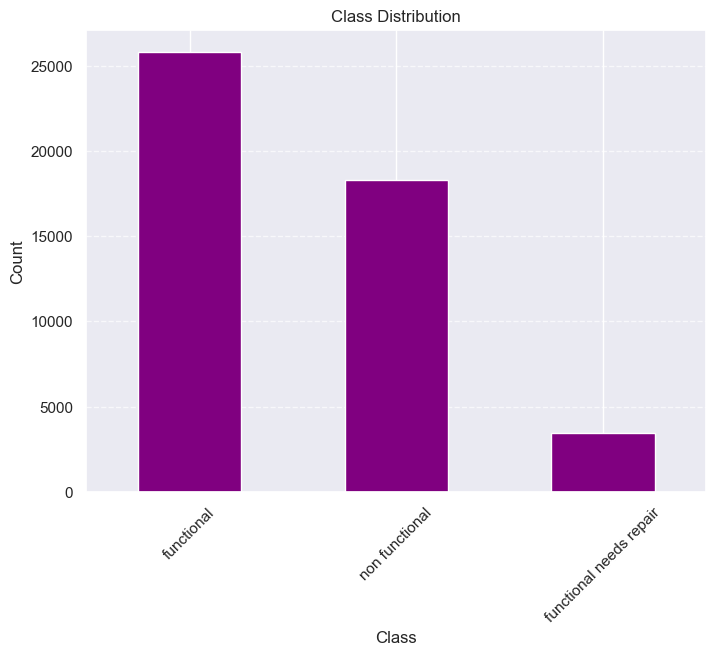

Imbalance Ratio: 0.13383965590731198


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

target_distribution = df['status_group'].value_counts()

# plot the distribution of each class
plt.figure(figsize=(8, 6))
target_distribution.plot(kind='bar', color='purple')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


imbalance_ratio = target_distribution.min() / target_distribution.max()
print("Imbalance Ratio:", imbalance_ratio)


In [ ]:
##s above

## Imputing missing values
- KNN imputer is preferred since it imputes values based on closely similar datapoints
- One neigbour is used for imputation, this avoids meaningless imputation for categorical features
- To avoid data leakage, a test set is reserved before any data preprocessing
- This will be used to evaluate the models after training is completed
- imputation done here is just for exploratoty analysis

#### Author - Ayush

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# date columns to timestamps
if 'date_recorded' in df.columns:
    df['date_recorded'] = pd.to_datetime(df['date_recorded']).astype('int64')

# categorical columns to numeric using Label Encoding or One-Hot Encoding
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    if col != 'date_recorded':  # Skip the date column since it's already converted
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])

# the KNNImputer
imputer = KNNImputer(n_neighbors=1)

try:
    tmp = imputer.fit_transform(df)
except KeyError:
    print('Variable not found')

df_imp = pd.DataFrame(tmp, columns=imputer.get_feature_names_out())

print(df_imp.shape)
print(df.shape)

(47520, 40)
(47520, 40)


In [ ]:
# Counts for target `status_group`and categorical features

for v in list_cat:
    print(df_imp[v].value_counts())


basin
4.0    8189
5.0    7200
6.0    6336
0.0    6258
3.0    5141
8.0    4838
1.0    4064
7.0    3529
2.0    1965
Name: count, dtype: int64
public_meeting
1.0    40809
0.0     4051
2.0     2660
Name: count, dtype: int64
recorded_by
0.0    47520
Name: count, dtype: int64
permit
1.0    31136
0.0    13943
2.0     2441
Name: count, dtype: int64
extraction_type_class
0.0    21478
1.0    13127
3.0     5149
5.0     4937
2.0     2389
4.0      345
6.0       95
Name: count, dtype: int64
management_group
4.0    41959
0.0     2937
2.0     1439
1.0      744
3.0      441
Name: count, dtype: int64
payment
0.0    20276
4.0     7205
3.0     6606
6.0     6549
5.0     3110
2.0     2931
1.0      843
Name: count, dtype: int64
payment_type
2.0    20276
5.0     7205
1.0     6606
6.0     6549
3.0     3110
0.0     2931
4.0      843
Name: count, dtype: int64
water_quality
6.0    40627
4.0     3854
7.0     1524
3.0      657
0.0      394
5.0      289
1.0      159
2.0       16
Name: count, dtype: int64
quality_gro

## Data Visualisation
  - High Distinct Counts: Identifies and excludes columns from the correlation analysis if they contain more than 1000 unique values, avoiding distortion in the correlation results due to high cardinality.

  - Column Exclusion: Specific columns are predefined to be excluded from the correlation heatmap to ensure the analysis focuses only on relevant numerical data.

  - Correlation Heatmap Preparation: After excluding specified columns, the remaining numerical data is coerced to numeric types, and a correlation matrix is computed. This matrix is then visualized as a heatmap, providing a graphical representation of how variables are correlated.

#### Author - Ayush

Columns with Very High Distinct Counts:
['id', 'funder', 'gps_height', 'installer', 'longitude', 'latitude', 'wpt_name', 'subvillage', 'ward', 'population', 'scheme_name']


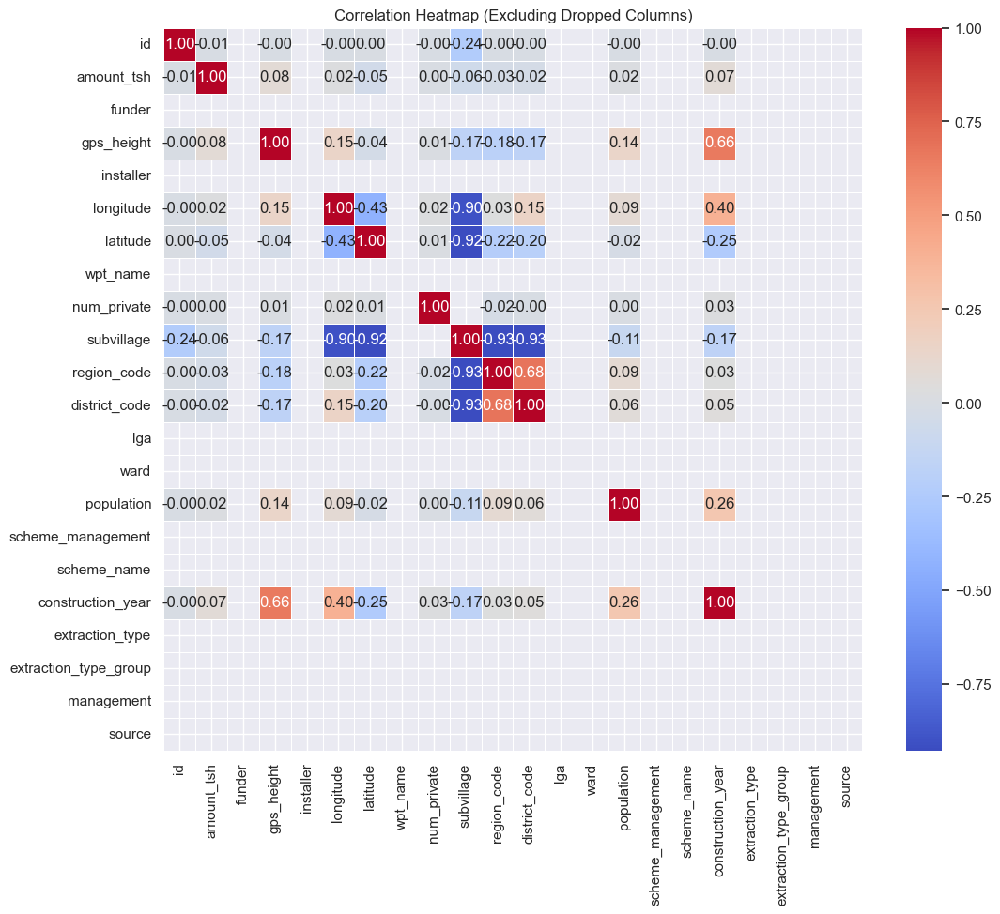

In [ ]:
# finding the number of unique values for each column and drop it before creating th heatmap
unique_value_counts = combined_data.nunique()
threshold = 1000
high_distinct_columns = unique_value_counts[unique_value_counts > threshold].index.tolist()

print("Columns with Very High Distinct Counts:")
print(high_distinct_columns)

# columns to exclude from correlation analysis
exclude_columns = [
    'basin', 'date_recorded', 'public_meeting', 'recorded_by', 'permit',
    'extraction_type_class', 'management_group', 'payment', 'payment_type',
    'water_quality', 'quality_group', 'quantity', 'quantity_group', 'source_type',
    'source_class', 'waterpoint_type', 'waterpoint_type_group', 'status_group',
    'region'
]

# dropping the specified columns from the DataFrame
numeric_data = combined_data.drop(exclude_columns, axis=1)
numeric_data = numeric_data.apply(pd.to_numeric, errors='coerce')
corr_matrix = numeric_data.corr()

# heatmap without dropped columns
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# set the title of the heatmap
plt.title('Correlation Heatmap (Excluding Dropped Columns)')

# show the heatmap
plt.show()

In [ ]:
# changing categorical features to int for better hist plots
data_cat = df_imp[list_cat]
data_types =  data_cat.dtypes

for feature in list_cat:
    # if data_cat[feature].dtype!=object:
    data_cat.loc[:,feature] = data_cat[feature].astype('int64')

## Categorical features versus `Status Group`
- To be confirmed later by statistical tests, to ensure the observed differences are not by chance

#### Author - Ayush

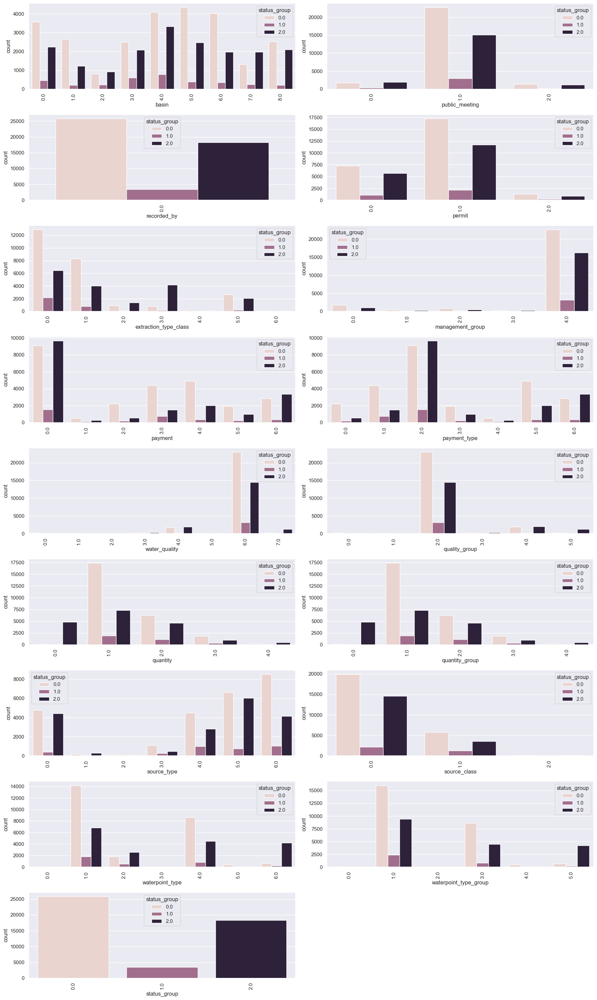

In [ ]:
# Creating a figure with 9x2 subplots for the 18 subplots grid (one will remain empty)
fig, axs = plt.subplots(9, 2, figsize=(18, 30))

# Flattening the array of axes, so we can iterate over them
flat_axs = axs.ravel()

# Ploting the first 16 categorical series
for ax, series in zip(flat_axs[:16], data_cat.columns[:16]):
    sns.countplot(x=series, ax=ax, data=data_cat, hue='status_group')
    ax.tick_params(axis='x', rotation=90)  # Rotate x-axis labels to prevent overlap

# Adding the 17th plot in the first column of the last row
sns.countplot(x=data_cat.columns[16], ax=flat_axs[16], data=data_cat, hue='status_group')
flat_axs[16].tick_params(axis='x', rotation=90)  # Rotate x-axis labels to prevent overlap
flat_axs[-1].set_visible(False)

# Adjusting the layout of the plots to prevent overlap and to organize the spacing
plt.tight_layout()
plt.show()


## Visualizing Continuous data
- 8 features have outliers, these need be removed
- some are so huge, potentially indicating data entry errors

#### Author - Rohan

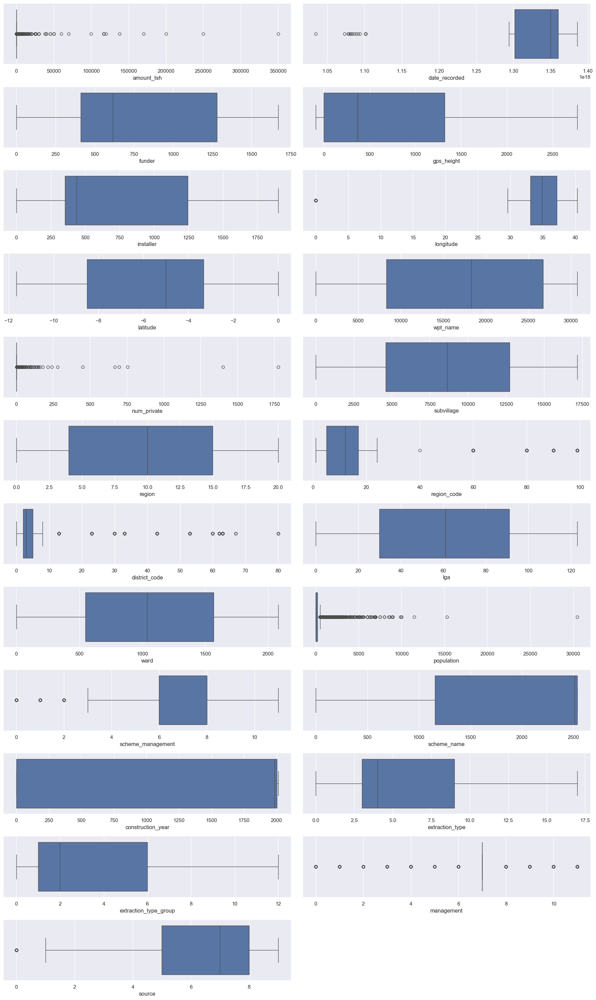

In [ ]:
# Assuming df_imp and list_cat are already defined
list_cont = [i for i in df_imp.columns.values if i not in list_cat]
data_cont = df_imp.loc[:, list_cont]
# print(list_cont)

# Calculate the number of rows needed for 23 plots
n_rows = len(data_cont.columns) // 2 + len(data_cont.columns) % 2
fig, axs = plt.subplots(n_rows, 2, figsize=(18, 30))  # Adjust rows for the exact number of plots

# Flatten the array of axes for easy iteration and hide the last plot
flat_axs = axs.ravel()
for ax, series in zip(flat_axs, data_cont):
    sns.boxplot(x=series, ax=ax, data=data_cont)

# If there's an odd number of plots, hide the last one
if len(data_cont.columns) % 2 != 0:
    flat_axs[-1].set_visible(False)

plt.tight_layout()
plt.show()

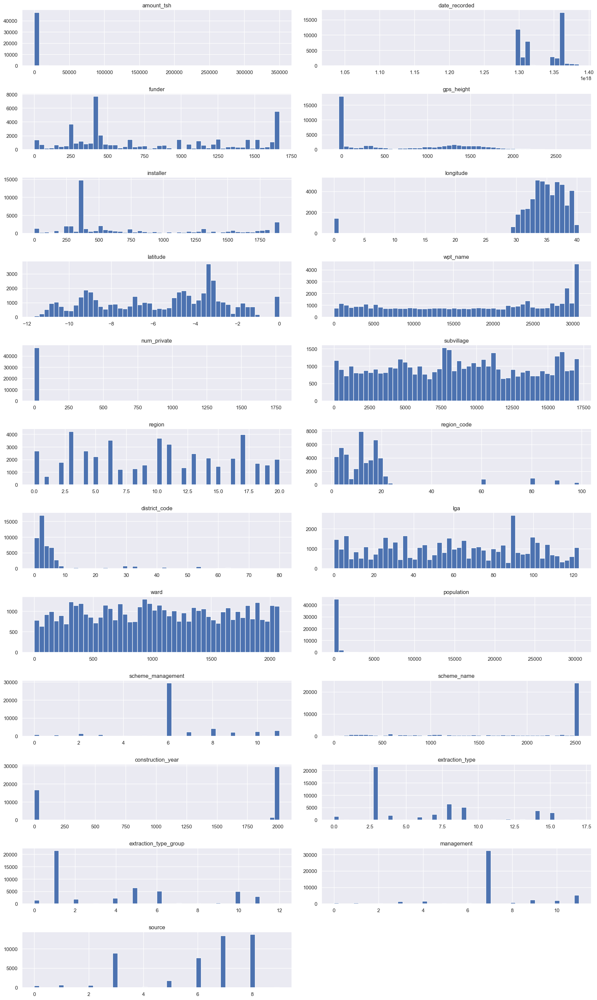

In [ ]:
# Assuming data_cont is a DataFrame with continuous variables already defined
fig, axs = plt.subplots(12, 2, figsize=(18, 30))
axs = axs.ravel()

# Loop through the first 23 columns of data_cont
for i, col in enumerate(data_cont.iloc[:, :23].columns.values):
    axs[i].hist(x=col, bins=50, data=data_cont)
    axs[i].set_title(col)

# Hide any remaining subplots that are not needed
for j in range(23, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

## Pair Plot

This pair plot reveals relationships between the variables and the status groups but also underscores the challenges of visualizing high-dimensional and mixed-type data. Further analysis using feature engineering, dimensionality reduction techniques, or specific models that can handle categorical variables might be necessary to gain more actionable insights.

#### Author - Rohan

D:\OneDrive\anaconda\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\simay\AppData\Local\Temp\ipykernel_21740\3753869097.py:14: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


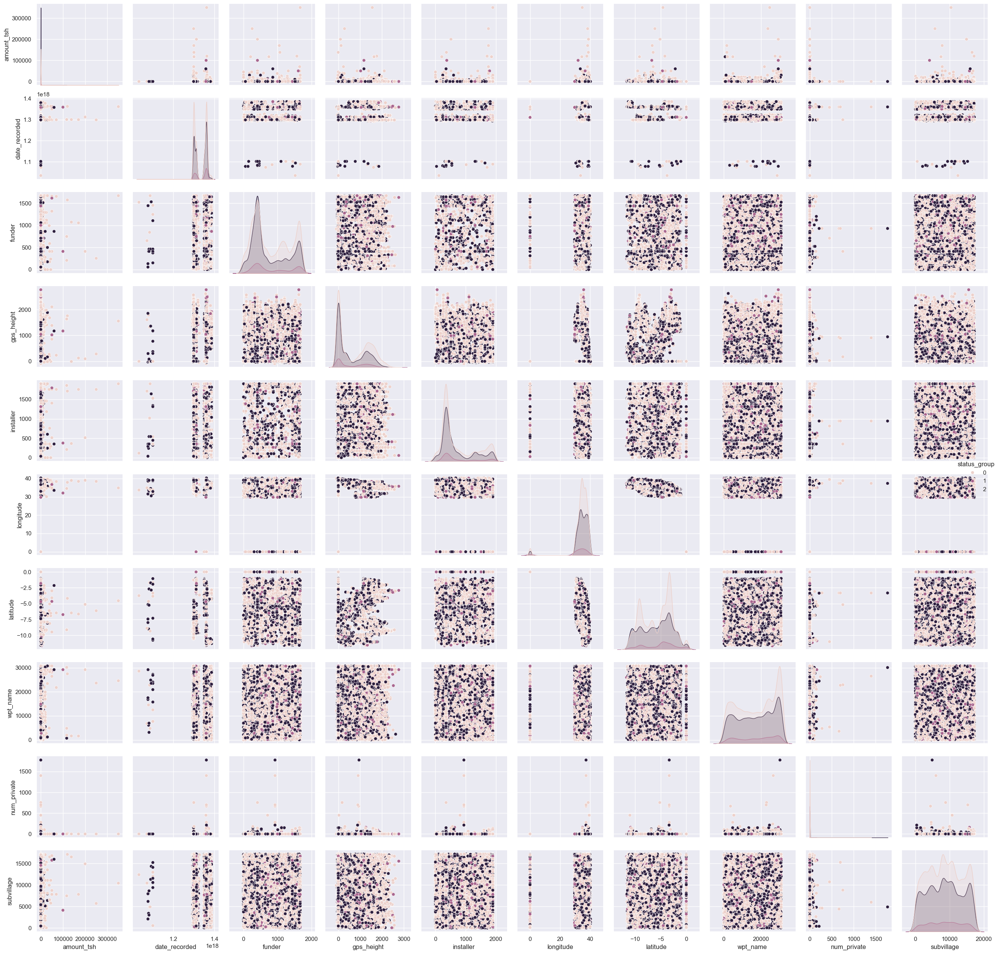

In [ ]:
# Pairs plots
# list_cont_status_group = list_cont[:]
# list_cont_status_group.insert(0,'status_group')
# df.loc[:,list_cont_status_group]
# sns.pairplot(data=df.loc[:,list_cont_status_group[0:11]],hue='status_group

list_cont_status_group = list_cont[:]
list_cont_status_group.insert(0, 'status_group')

# Create pairplot
pair_plot = sns.pairplot(data=df.loc[:, list_cont_status_group[0:11]], hue='status_group')

# Adjust the spacing between the plots
plt.tight_layout()

# To show the plot if not running in an interactive environment (like a Jupyter notebook)
plt.show()


D:\OneDrive\anaconda\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


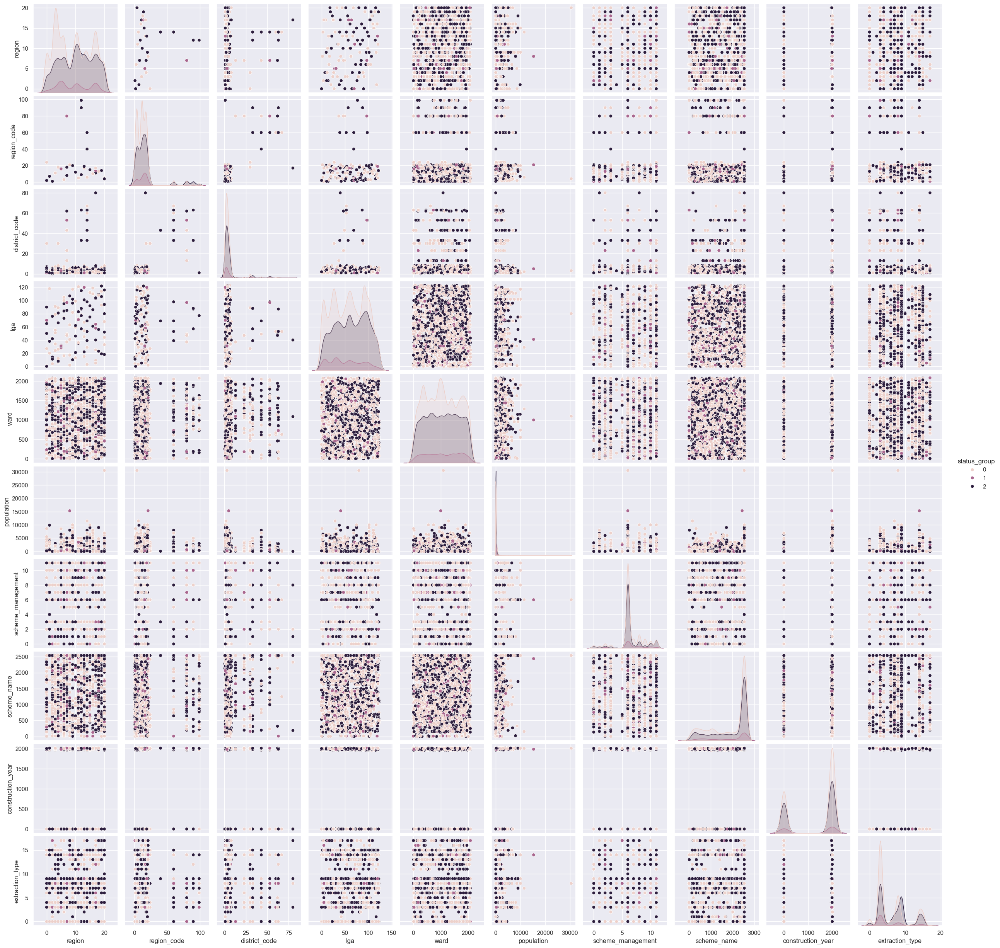

In [ ]:
l2 = list_cont_status_group[11:21]
l2.insert(0,'status_group')
sns.pairplot(data=df.loc[:,l2],hue='status_group')

D:\OneDrive\anaconda\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


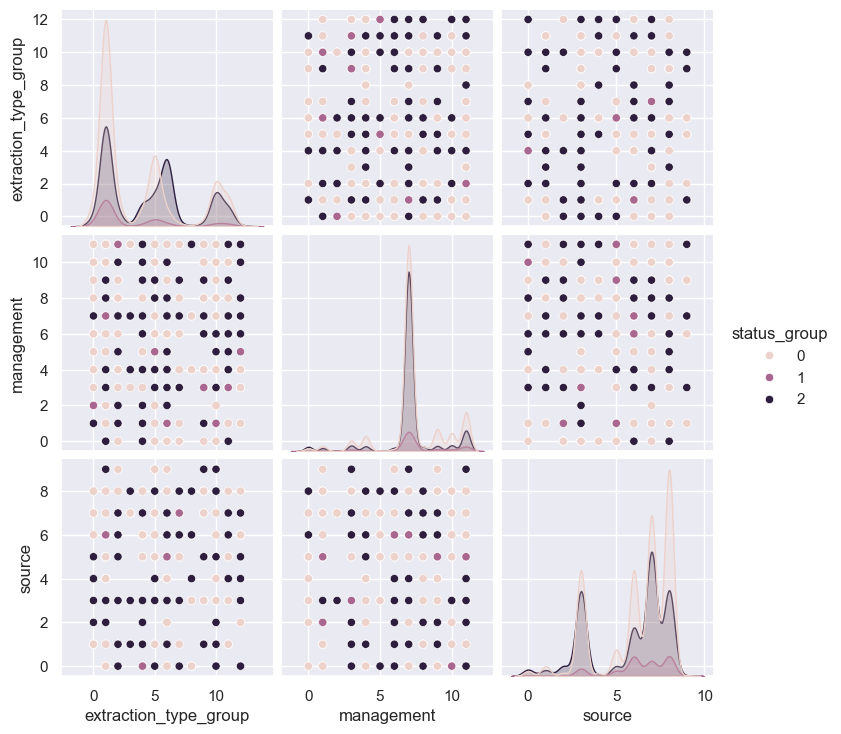

In [ ]:
l3 = list_cont_status_group[21:24]
l3.insert(0,'status_group')
sns.pairplot(data=df.loc[:,l3],hue='status_group')

## Comparing feature ranges
 - Huge difference between feature ranges, normalization necessary.
 - It's reasonable to conclude that there is a significant difference in the range of values across features. Specifically, if the y-axis is indeed showing values up to 1e18, this suggests an extremely large range in at least one feature compared to the others, which appear to have much smaller ranges.

#### Authors - Ayush and Rohan

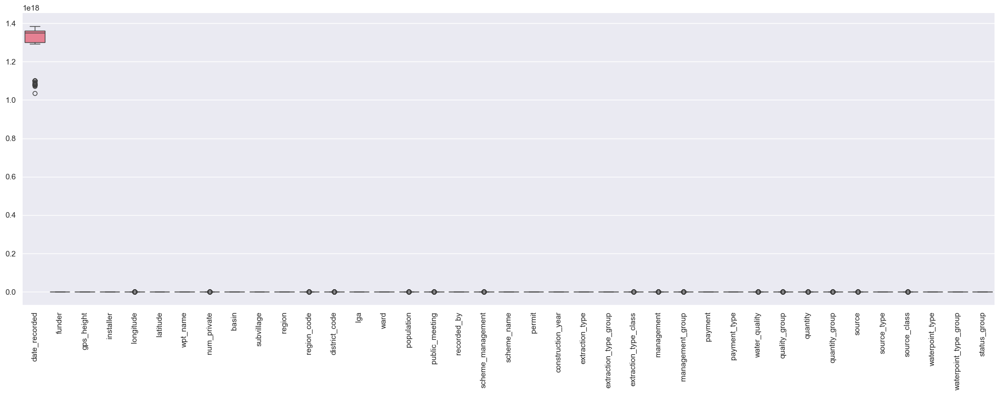

In [ ]:
fig, ax = plt.subplots(1, figsize=(20,8))  # Adjust the width as needed
sns.boxplot(data=df.iloc[:,1:40], ax=ax)
plt.xticks(rotation=90)  # This will rotate the feature names so they are readable
plt.tight_layout()
plt.show()

## Dealing with Outliers
- Identifying them by using factor 1.5*IQR, Ref: Brownlee, J., 2020. Data preparation for machine learning: data cleaning, feature selection, and data transforms in Python. Machine Learning Mastery.
- Replacing them with median values.

In [ ]:
class OutlierRemover:
    """
    Takes `dataframe` as an input and list of continuous features in data frame 'cont_features_list'
    to get a list of features with outliers pass `.features_with_outliers` attribute to OutlierRemover object instance
    """
    def __init__(self,dataframe,cont_features_list):
        self.dataframe = dataframe
        self.cont_features_list = cont_features_list


    def transform(self,factor=3):
        """
        Factor is a multiplying factor to the interquartile range (IQR), cutoff = factor*IQR. Default is 3 for extreme outliers, 1.5 can be used.
        An outlier is identified as feature value that is larger than 3rd quatile + cutoff or less 1st quartile - cutoff value.
        """
        data_cont = self.dataframe.loc[:,self.dataframe.columns.isin(self.cont_features_list)]
        p25, p50, p75 = np.nanquantile(data_cont,.25,axis=0),np.nanquantile(data_cont,.5,axis=0),np.nanquantile(data_cont,.75,axis=0)

        cutoff = factor*(p75-p25)
        lower, upper = p25 - cutoff, p75 + cutoff

        dict_upper = dict()
        dict_lower = dict()
        dict_med = dict()
        for low, up, med,col in zip(lower,upper,p50,data_cont.columns.values):
            dict_lower[col] = low
            dict_upper[col] = up
            dict_med[col] = med


        self.features_with_outliers = []
        for col in data_cont.columns.values:
            if any(data_cont[col]<dict_lower[col]) or any(data_cont[col]>dict_upper[col]):
                self.features_with_outliers.append(col)

        # for col in data_cont.columns.values:
        for col in self.features_with_outliers:
            data_cont.loc[data_cont[col]>dict_upper[col],col] = dict_med[col]
            data_cont.loc[data_cont[col]<dict_lower[col],col] = dict_med[col]

        # Combine transformed features back to original data
        df1 = self.dataframe.loc[:,~self.dataframe.columns.isin(list_cont)]

        return pd.merge(df1,data_cont,left_index=True,right_index=True)

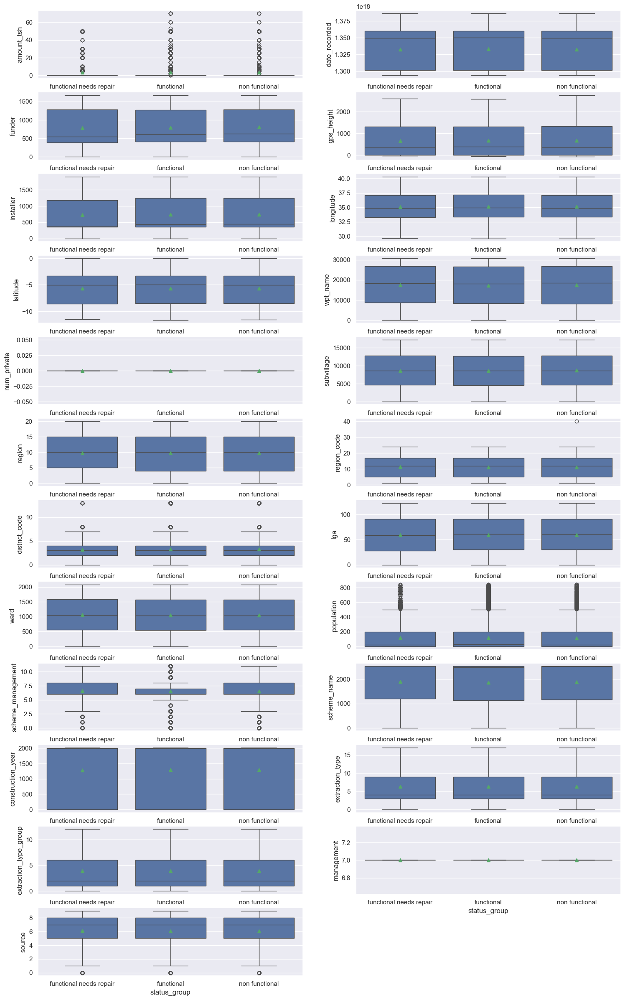

In [ ]:
ourm = OutlierRemover(data_cont,list_cont)
data_cont_ourm = ourm.transform()
# # Visualize boxplots
# fig, axs = plt.subplots(12,2,figsize=(40,30))
# ax = axs.ravel()
df_cont_status_group = pd.merge(data_train.loc[:,['status_group']],data_cont_ourm,left_index=True,right_index=True)
# Visualize boxplots
# Determine the number of columns to plot (excluding 'status_group')
num_columns_to_plot = len(df_cont_status_group.columns.values[1:])
# Calculate the number of rows needed for the subplots
num_rows = (num_columns_to_plot + 1) // 2
fig, axs = plt.subplots(num_rows, 2, figsize=(18, 30))  # Adjusted number of rows
ax = axs.ravel()
for i, j in enumerate(df_cont_status_group.columns.values[1:]):
    sns.boxplot(x=df_cont_status_group['status_group'], y=df_cont_status_group.iloc[:, 1:].loc[:, j], ax=ax[i], showmeans=True)
# If there's an odd number of columns, the last subplot won't be used, so hide it
if num_columns_to_plot % 2 != 0:
    ax[-1].axis('off')  # Hide the last subplot if it's not needed

In [ ]:
# s above

## ANOVA Test
- This will later be incorporated in pipeline for feature selection

#### Author - Rohan

In [ ]:
## ANOVA test
from sklearn.feature_selection import f_classif, SelectKBest
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
X_anova = data_cont_ourm.iloc[:,1:]
y_anova=data_cat.loc[:,'status_group']

fstats, pvalues = f_classif(X_anova,y_anova)

fselector = SelectKBest(f_classif, k=10)
fselector.fit_transform(X_anova,y_anova)

print(fselector.get_feature_names_out())
print(pvalues[pvalues<0.05])


# print(f"selected features: {X_anova.columns.values[fselector.get_support()]}")
# print(pvalues)

['funder' 'gps_height' 'longitude' 'latitude' 'region' 'lga'
 'construction_year' 'extraction_type' 'extraction_type_group' 'source']
[2.91794133e-025 1.84932429e-050 2.17531620e-134 3.59929335e-023
 1.40523900e-076 5.01257113e-031 4.44537428e-004 9.95864597e-090
 4.16983586e-027 2.32724130e-028 2.79949988e-079 4.95913729e-002
 3.51383908e-004 8.97787596e-017 1.17212066e-024 1.00927823e-034
 3.66668001e-170 1.26451129e-198 1.43939324e-117]


## Chi-square test for categorical feature selection
 - 14 features returned a statistically significant test at 5% significance level

#### Author - Ayush

In [ ]:
from sklearn.feature_selection import chi2
X_chi = df_imp.loc[:,list_cat[0:16]]
y_chi = df_imp.loc[:,['status_group']]
chi2_selector = SelectKBest(chi2,k=16)
chi2_selector.fit_transform(X=X_chi,y=y_chi)
pvalues = chi2_selector.pvalues_

print(pvalues[pvalues<0.05])

print(chi2_selector.get_feature_names_out())

[1.51440898e-047 4.41997536e-003 3.75856293e-004 0.00000000e+000
 8.78860547e-006 1.60202789e-152 9.08636613e-082 1.09030921e-075
 3.62504478e-123 3.62504478e-123 1.05026694e-099 8.87269306e-077
 0.00000000e+000 0.00000000e+000]
['basin' 'public_meeting' 'recorded_by' 'permit' 'extraction_type_class'
 'management_group' 'payment' 'payment_type' 'water_quality'
 'quality_group' 'quantity' 'quantity_group' 'source_type' 'source_class'
 'waterpoint_type' 'waterpoint_type_group']


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

def preprocess_data(df):
    # date columns to numeric timestamps
    if 'date_recorded' in df.columns:
        df['date_recorded'] = pd.to_datetime(df['date_recorded'], errors='coerce')
        df['date_recorded'] = df['date_recorded'].astype('int64', errors='ignore')  # Convert datetime to int64

    # all categorical columns (including those with mixed types)
    categorical_columns = df.select_dtypes(include=['object', 'bool']).columns

    for col in categorical_columns:
        # Ensure all data in the column is of type string
        df[col] = df[col].fillna('Missing')  # fill NaNs first to handle missing values
        df[col] = df[col].astype(str)  # convert everything to string to ensure uniform data type

        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])  # and apply LabelEncoder

    return df


data_train = preprocess_data(data_train)
data_test = preprocess_data(data_test)

## MODELS

## Logistic Regressor
This code establishes a machine learning pipeline to predict the 'status_group' using logistic regression. Initially, it separates the features and the target variable while excluding specific columns. It employs K-nearest neighbors imputation for missing values and robust scaling to handle outliers. Feature selection is applied to both continuous and categorical data to optimize model inputs. The model is then tuned through grid search with cross-validation to find the best regularization parameter. Finally, it evaluates the model's performance using balanced accuracy and outputs a classification report.

#### Author - Ayush

In [ ]:
# applying robust scaler to image data to scale them and remove outliers
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, RepeatedStratifiedKFold,RepeatedKFold, cross_val_score,cross_val_predict
from sklearn.metrics import balanced_accuracy_score,confusion_matrix,classification_report,roc_curve,auc
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.impute import KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)


target = 'status_group'
features_to_exlude_in_x = ['id','status_group']

def split_x_y(dataframe,features_to_exlude_in_x,target):
    features_to_exlude_in_x.append(target)
    y = dataframe.loc[:,target]
    X = dataframe.loc[:,~dataframe.columns.isin(features_to_exlude_in_x)]
    return X, y

X,y = split_x_y(data_train ,features_to_exlude_in_x,target)

# Test data
X_test, y_test = split_x_y(data_test,features_to_exlude_in_x,target)
Xcols = X_test.columns.values

list_cont_transformers = [col for col in list_cont if col not in features_to_exlude_in_x]
list_cat_transformers = [col for col in list_cat if col not in features_to_exlude_in_x]

imputer = KNNImputer(n_neighbors=1)

cont_pipeline = Pipeline(steps=[('imputer',imputer),
                                ('scaler',RobustScaler()),
                                ('kbest_cont',SelectKBest(f_classif,k=9))])

cat_pipleline = Pipeline(steps=[('imputer',imputer),
                                ('kbest_cat',SelectKBest(chi2,k=4))])

transformer = ColumnTransformer(transformers=[('cont',cont_pipeline,list_cont_transformers),
                                              ('cat',cat_pipleline,list_cat_transformers)
                                            ])

regressor = LogisticRegression(max_iter=10_000,class_weight='balanced',random_state=0)
clf_lr = Pipeline(steps=[('processor',transformer),
                         ('regressor',regressor)])

param_grid = {
    'regressor__C':[0.01,0.05,1,2,5,10,20]
    # 'processor__cont__kbest_cont__k':list(range(1,10))
}

cv  = RepeatedStratifiedKFold(n_splits=5,n_repeats=5,random_state=0)
grid_search = GridSearchCV(estimator=clf_lr,param_grid=param_grid,cv=cv,n_jobs=-1,scoring='balanced_accuracy')

grid_search.fit(X,y)
clf_lr = grid_search.best_estimator_
ba_cv_clf_lr =cross_val_score(clf_lr,X,y,scoring='balanced_accuracy')

y_pred = clf_lr.predict(X_test)
ba_tst_clf_lr = balanced_accuracy_score(y_true=y_test,y_pred=y_pred)


print(f"BA CV: {np.mean(ba_cv_clf_lr):.3f}, cv_sd: {np.std(ba_cv_clf_lr):.3f}, BA Test: {ba_tst_clf_lr:.3f}")

report=classification_report(y_true=y_test,y_pred=y_pred)
print(report)
clf_lr

BA CV: 0.493, cv_sd: 0.009, BA Test: 0.487
              precision    recall  f1-score   support

           0       0.67      0.44      0.53      6452
           1       0.15      0.51      0.23       863
           2       0.51      0.51      0.51      4565

    accuracy                           0.47     11880
   macro avg       0.44      0.49      0.42     11880
weighted avg       0.57      0.47      0.50     11880



Pipeline(steps=[('processor',
                 ColumnTransformer(transformers=[('cont',
                                                  Pipeline(steps=[('imputer',
                                                                   KNNImputer(n_neighbors=1)),
                                                                  ('scaler',
                                                                   RobustScaler()),
                                                                  ('kbest_cont',
                                                                   SelectKBest(k=9))]),
                                                  ['amount_tsh',
                                                   'date_recorded', 'funder',
                                                   'gps_height', 'installer',
                                                   'longitude', 'latitude',
                                                   'wpt_name', 'num_private',
                                                   'subvillage', 'region',
                                                   'region_code',
                                                   'district_code', 'lg...
                                                                               score_func=<function chi2 at 0x00000250B5975A20>))]),
                                                  ['basin', 'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment', 'payment_type',
                                                   'water_quality',
                                                   'quality_group', 'quantity',
                                                   'quantity_group',
                                                   'source_type',
                                                   'source_class',
                                                   'waterpoint_type',
                                                   'waterpoint_type_group'])])),
                ('regressor',
                 LogisticRegression(C=20, class_weight='balanced',
                                    max_iter=10000, random_state=0))])

In [ ]:
## Storing model performance metrics
def model_performance(name,cross_validation_score,test_score):
    metrics = {'name':name,'ba_cv':np.mean(cross_validation_score),'sd':np.std(cross_validation_score),'ba_test':test_score}
    return metrics

performance_clf_lr= model_performance('Logistic',ba_cv_clf_lr,ba_tst_clf_lr)

In [ ]:
grid_search.best_params_

{'regressor__C': 20}

## KNN Classifier

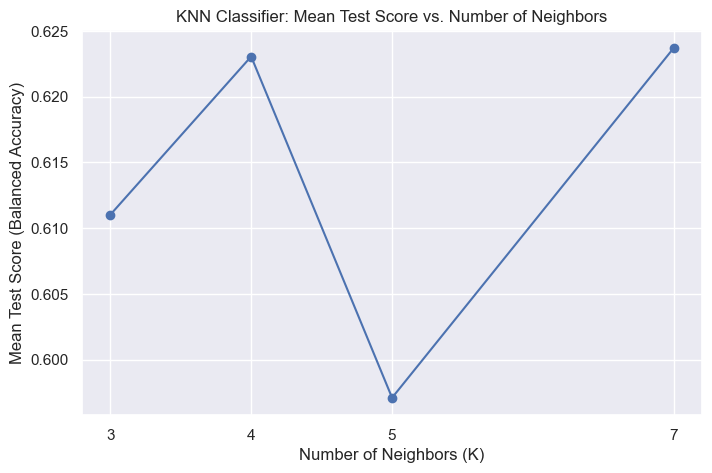

Best K Value for Accuracy: 7
BA CV: 0.624, cv_sd: 0.006, BA Test: 0.584
              precision    recall  f1-score   support

           0       0.75      0.79      0.77      6452
           1       0.35      0.27      0.31       863
           2       0.72      0.68      0.70      4565

    accuracy                           0.71     11880
   macro avg       0.60      0.58      0.59     11880
weighted avg       0.71      0.71      0.71     11880



Pipeline(steps=[('imputer', KNNImputer(n_neighbors=1)),
                ('scaler', RobustScaler()),
                ('classifier',
                 KNeighborsClassifier(n_neighbors=4, weights='distance'))])

In [ ]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold, cross_val_score
from sklearn.metrics import balanced_accuracy_score, classification_report
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

target = 'status_group'
features_to_exclude_in_x = ['id', 'status_group']

def split_x_y(dataframe, features_to_exclude_in_x, target):
    features_to_exclude_in_x.append(target)
    y = dataframe.loc[:, target]
    X = dataframe.loc[:, ~dataframe.columns.isin(features_to_exclude_in_x)]
    return X, y

X, y = split_x_y(data_train, features_to_exclude_in_x, target)

X_test, y_test = split_x_y(data_test, features_to_exclude_in_x, target)

imputer = KNNImputer(n_neighbors=1)
scaler = RobustScaler()
knn = KNeighborsClassifier()

model_knn = Pipeline(steps=[
    ('imputer', imputer),
    ('scaler', scaler),
    ('classifier', knn)
])

param_grid = {
    'classifier__n_neighbors': [3, 4, 5, 7],
    'classifier__weights': ['uniform', 'distance']
}

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=0)
grid_search = GridSearchCV(estimator=model_knn, param_grid=param_grid, cv=cv, n_jobs=-1, scoring='balanced_accuracy')

grid_search.fit(X, y)
best_knn_model = grid_search.best_estimator_

# plot for different numbers of k values
mean_scores = grid_search.cv_results_['mean_test_score']
k_values = param_grid['classifier__n_neighbors']

plt.figure(figsize=(8, 5))
plt.plot(k_values, mean_scores[:len(k_values)], marker='o')
plt.xlabel('Number of Neighbors (K)')
plt.ylabel('Mean Test Score (Balanced Accuracy)')
plt.title('KNN Classifier: Mean Test Score vs. Number of Neighbors')
plt.xticks(k_values)
plt.grid(True)
plt.show()

# the best K value for accuracy
best_k_index = np.argmax(mean_scores)
best_k_value = k_values[best_k_index]
print(f"Best K Value for Accuracy: {best_k_value}")

ba_cv_knn = cross_val_score(best_knn_model, X, y, scoring='balanced_accuracy', cv=cv)

y_pred = best_knn_model.predict(X_test)
ba_test_knn = balanced_accuracy_score(y_true=y_test, y_pred=y_pred)

print(f"BA CV: {np.mean(ba_cv_knn):.3f}, cv_sd: {np.std(ba_cv_knn):.3f}, BA Test: {ba_test_knn:.3f}")

report_knn = classification_report(y_true=y_test, y_pred=y_pred)
print(report_knn)
best_knn_model

In [ ]:
performance_bal_KNN = model_performance('KNN',ba_cv_knn ,ba_test_knn)

## LIGHTGBM MODEL

In [ ]:
# pip install lightgbm

In [ ]:
import warnings
import numpy as np
import lightgbm as lgb
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold, cross_val_score
from sklearn.metrics import balanced_accuracy_score, classification_report
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

target = 'status_group'
features_to_exclude_in_x = ['id', 'status_group']

def split_x_y(dataframe, features_to_exclude_in_x, target):
    features_to_exclude_in_x.append(target)
    y = dataframe.loc[:, target]
    X = dataframe.loc[:, ~dataframe.columns.isin(features_to_exclude_in_x)]
    return X, y

X, y = split_x_y(data_train, features_to_exclude_in_x, target)


X_test, y_test = split_x_y(data_test, features_to_exclude_in_x, target)

imputer = KNNImputer(n_neighbors=1)
scaler = RobustScaler()
lgb_classifier = lgb.LGBMClassifier()

model_lgbm = Pipeline(steps=[
    ('imputer', imputer),
    ('scaler', scaler),
    ('classifier', lgb_classifier)
])

param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__learning_rate': [0.05, 0.1, 0.2],
    'classifier__max_depth': [3, 4, 5]
}

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=0)
grid_search = GridSearchCV(estimator=model_lgbm, param_grid=param_grid, cv=cv, n_jobs=-1, scoring='balanced_accuracy')

grid_search.fit(X, y)
best_lgbm_model = grid_search.best_estimator_
ba_cv_lgbm = cross_val_score(best_lgbm_model, X, y, scoring='balanced_accuracy', cv=cv)

y_pred = best_lgbm_model.predict(X_test)
ba_test_lgbm = balanced_accuracy_score(y_true=y_test, y_pred=y_pred)


report_lgbm = classification_report(y_true=y_test, y_pred=y_pred)
print(report_lgbm)
best_lgbm_model

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3302
[LightGBM] [Info] Number of data points in the train set: 47520, number of used features: 38
[LightGBM] [Info] Start training from score -0.610505
[LightGBM] [Info] Start training from score -2.621618
[LightGBM] [Info] Start training from score -0.956493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


Pipeline(steps=[('imputer', KNNImputer(n_neighbors=1)),
                ('scaler', RobustScaler()),
                ('classifier',
                 LGBMClassifier(learning_rate=0.2, max_depth=5,
                                n_estimators=300))])

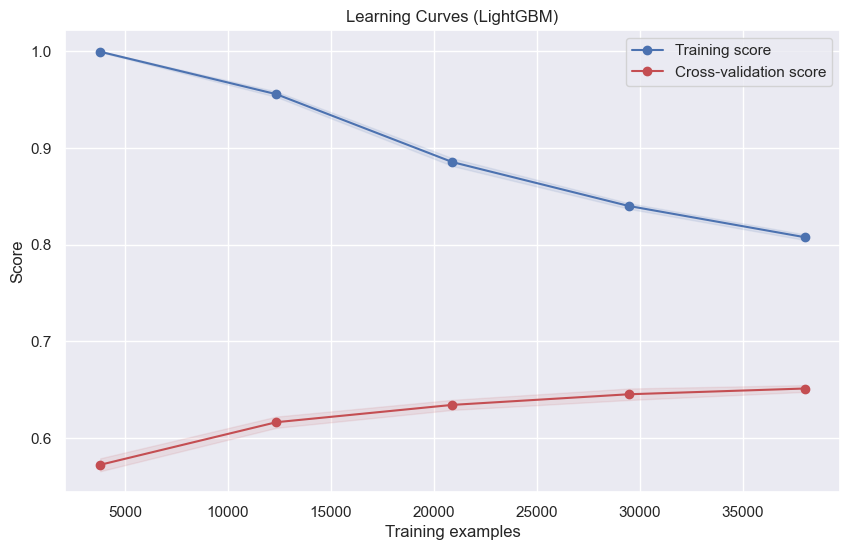

In [ ]:
# plot for learning curves
from sklearn.model_selection import train_test_split, learning_curve

train_sizes, train_scores, val_scores = learning_curve(grid_search.best_estimator_, X, y, cv=cv, n_jobs=-1, scoring='balanced_accuracy')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
val_std = np.std(val_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color="b")
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1, color="r")
plt.plot(train_sizes, train_mean, 'o-', color="b", label="Training score")
plt.plot(train_sizes, val_mean, 'o-', color="r", label="Cross-validation score")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.title("Learning Curves (LightGBM)")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [ ]:
print(f"BA CV: {np.mean(ba_cv_lgbm):.3f}, cv_sd: {np.std(ba_cv_lgbm):.3f}, BA Test: {ba_test_lgbm:.3f}")

BA CV: 0.651, cv_sd: 0.003, BA Test: 0.595


In [ ]:
performance_bal_LGBM = model_performance('LGBM',ba_cv_lgbm ,ba_test_lgbm)

## Decision Tree

In [ ]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold, cross_val_score
from sklearn.metrics import balanced_accuracy_score, classification_report
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

target = 'status_group'
features_to_exclude_in_x = ['id', 'status_group']

def split_x_y(dataframe, features_to_exclude_in_x, target):
    features_to_exclude_in_x.append(target)
    y = dataframe.loc[:, target]
    X = dataframe.loc[:, ~dataframe.columns.isin(features_to_exclude_in_x)]
    return X, y

X, y = split_x_y(data_train, features_to_exclude_in_x, target)

X_test, y_test = split_x_y(data_test, features_to_exclude_in_x, target)

imputer = KNNImputer(n_neighbors=1)
scaler = RobustScaler()
dt_classifier = DecisionTreeClassifier()

model_dt = Pipeline(steps=[
    ('imputer', imputer),
    ('scaler', scaler),
    ('classifier', dt_classifier)
])

param_grid = {
    'classifier__max_depth': [3, 4, 5, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=0)
grid_search = GridSearchCV(estimator=model_dt, param_grid=param_grid, cv=cv, n_jobs=-1, scoring='balanced_accuracy')

grid_search.fit(X, y)
best_dt_model = grid_search.best_estimator_

ba_cv_dt = cross_val_score(best_dt_model, X, y, scoring='balanced_accuracy', cv=cv)

y_pred_dt = best_dt_model.predict(X_test)
ba_test_dt = balanced_accuracy_score(y_true=y_test, y_pred=y_pred_dt)

print(f"BA CV: {np.mean(ba_cv_dt):.3f}, cv_sd: {np.std(ba_cv_dt):.3f}, BA Test: {ba_test_dt:.3f}")

report_dt = classification_report(y_true=y_test, y_pred=y_pred_dt)
print(report_dt)
best_dt_model

BA CV: 0.632, cv_sd: 0.006, BA Test: 0.547
              precision    recall  f1-score   support

           0       0.73      0.69      0.71      6452
           1       0.21      0.27      0.24       863
           2       0.66      0.68      0.67      4565

    accuracy                           0.66     11880
   macro avg       0.53      0.55      0.54     11880
weighted avg       0.67      0.66      0.66     11880



Pipeline(steps=[('imputer', KNNImputer(n_neighbors=1)),
                ('scaler', RobustScaler()),
                ('classifier', DecisionTreeClassifier())])

In [ ]:
performance_bal_dt = model_performance('Decision Tree',ba_cv_dt ,ba_test_dt)

## Random forest Classifier
- Does not require feature selection, since by its design has inbuit feature selection methods
- Thus model is trained with all features included, redundant features will be dropped automatically

The code configures and evaluates a balanced random forest classifier to handle class imbalance in a dataset. It uses K-nearest neighbors for imputation, optimizes the model through grid search and cross-validation, and assesses its performance with balanced accuracy metrics, providing a comprehensive approach to building a robust classifier for imbalanced data.

#### Author - Rohan

In [ ]:
# Apply robust scaler to image data to scale them and remove outliers
# With feature selection
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, RepeatedStratifiedKFold,RepeatedKFold, cross_val_score,cross_val_predict
from sklearn.metrics import balanced_accuracy_score,accuracy_score,confusion_matrix
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.compose import TransformedTargetRegressor
from imblearn.ensemble import BalancedRandomForestClassifier

imputer = KNNImputer(n_neighbors=1)

clf_rf = BalancedRandomForestClassifier(200,random_state=0,bootstrap=True,class_weight='balanced_subsample')

model_rf = Pipeline(steps=[('imputer',imputer),('classifier',clf_rf)])


param_grid = param_grid = {#'classifier__max_features': [2,4,6,8,13],
                           'classifier__max_depth': [2,3,4,6]}

cv = RepeatedStratifiedKFold(n_repeats=4,n_splits=10,random_state=0)
grid_search = GridSearchCV(estimator=model_rf,param_grid=param_grid,cv=cv,scoring='balanced_accuracy',n_jobs=-1)
grid_search.fit(X=X,y=y)
bal_random_forest = grid_search.best_estimator_
best_parameters = grid_search.best_params_

ba_cv_rf = cross_val_score(bal_random_forest,X,y,scoring='balanced_accuracy')


# Predict and test
y_pred = bal_random_forest.predict(X_test)
ba_test_rf = balanced_accuracy_score(y_true=y_test,y_pred=y_pred)


print(f"BA CV: {np.mean(ba_cv_rf):.3f}, cv_sd: {np.std(ba_cv_rf):.3f}, BA Test: {ba_test_rf:.3f}")
report=classification_report(y_true=y_test,y_pred=y_pred)
print(report)
bal_random_forest

BA CV: 0.625, cv_sd: 0.005, BA Test: 0.603
              precision    recall  f1-score   support

           0       0.73      0.74      0.73      6452
           1       0.19      0.54      0.28       863
           2       0.84      0.53      0.65      4565

    accuracy                           0.64     11880
   macro avg       0.59      0.60      0.56     11880
weighted avg       0.73      0.64      0.67     11880



Pipeline(steps=[('imputer', KNNImputer(n_neighbors=1)),
                ('classifier',
                 BalancedRandomForestClassifier(bootstrap=True,
                                                class_weight='balanced_subsample',
                                                max_depth=6, n_estimators=200,
                                                random_state=0))])

In [ ]:
performance_bal_rf = model_performance('Random Forest',ba_cv_rf,ba_test_rf)

## XGBoost Classifier
The code sets up a pipeline for training an XGBoost classifier on a dataset that potentially has missing values and imbalance in the target variable distribution. It employs a KNN imputer to handle missing data, scales categorical features using one-hot encoding, and adjusts class weights to manage imbalance. The model's hyperparameters are optimized through grid search over specified parameters and cross-validation, aiming to maximize the balanced accuracy score. Finally, the trained model is evaluated on a test dataset to measure its performance, providing both cross-validation and test accuracy metrics, alongside a detailed classification report.

#### Author - Ayush

In [1]:
# simple xgboost
# Apply robust scaler to image data to scale them and remove outliers
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, RepeatedStratifiedKFold,RepeatedKFold, cross_val_score,cross_val_predict
from sklearn.metrics import balanced_accuracy_score, confusion_matrix
from sklearn.preprocessing import RobustScaler,OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.compose import TransformedTargetRegressor

# Dataframe used is df_imputed, processing steps are embedded in a pipeline
target = 'status_group'
features_to_exlude_in_x = ['id','status_group']


X,y = split_x_y(data_train,features_to_exlude_in_x,target)


X_test, y_test = split_x_y(data_test,features_to_exlude_in_x,target)
Xcols = X_test.columns.values

imputer = Pipeline(steps=[('knn_imputer',KNNImputer(n_neighbors=1))])
cv = RepeatedStratifiedKFold(n_repeats=3,n_splits=10,random_state=0)
classifier = XGBClassifier(scale_pos_weight = 0.78/0.22,n_jobs=-1)
model = Pipeline(steps=[('imputer',imputer),('classifier',classifier)])


# Learning rate controls overfitting, the smaller learning rate means less correction is made to the preceding tree
# low value for learning rate  results into more trees
# `colsample_bytree` fraction of features to be used to build tree
# `gamma` minimum loss reduction to make split. It is pseudo-regularization hyperparameter for complexity control

param_grid = param_grid = {#'classifier__n_estimators': [100,200,300],
                            'classifier__max_depth': [3,4,5],
                            'classifier__learning_rate': [0.1,0.05,0.01],
                            'classifier__gamma': [0,0.25,1],
                            'classifier__colsample_bytree':[0.05,0.1,0.15]}

grid_search = GridSearchCV(estimator=model,param_grid=param_grid,cv=cv,scoring='balanced_accuracy')
grid_search.fit(X,y)
xgb = grid_search.best_estimator_
ba_xgb_cv = cross_val_score(xgb, X, y, cv=cv, scoring='balanced_accuracy')



y_pred = xgb.predict(X_test)
ba_xgb_test = balanced_accuracy_score(y_true=y_test,y_pred=y_pred)

print(f"Cross-validation accuracy: {ba_xgb_cv.mean():.2f}, SD: {ba_xgb_cv.std():.2f}")
print(f"Test accuracy: {ba_xgb_test:.2f}")
report=classification_report(y_true=y_test,y_pred=y_pred)
print(report)
xgb

NameError: name 'split_x_y' is not defined

In [ ]:
performance_xgb = model_performance('XGBoost',ba_xgb_cv,ba_xgb_test)

## Voting Classifier

This code implements an ensemble model using a voting classifier that combines predictions from several machine learning models—Random Forest, Logistic Regression, XGBoost, KNN, and LightGBM—using a soft voting mechanism. Soft voting allows the classifier to predict the class label based on the argmax of the sums of the predicted probabilities. The ensemble's performance is evaluated using cross-validation on the training set to ensure robustness, with balanced accuracy as the scoring metric. After training, the model is used to predict the class labels on the test dataset, and the performance is measured using the balanced accuracy score. The code outputs the average balanced accuracy from cross-validation, its standard deviation, and the balanced accuracy on the test set.

#### Author - Rohan

In [ ]:
from sklearn.ensemble import VotingClassifier

clf_voting = VotingClassifier(estimators=[('Random_forest',bal_random_forest),('Logit',clf_lr), ('Xgb',xgb), ('KNN',best_knn_model), ('LGCM', best_lgbm_model)],voting='soft')
cv = RepeatedStratifiedKFold(random_state=0,n_repeats=3,n_splits=5)
ba_cv_voting = cross_val_score(clf_voting, X, y, cv=cv, scoring='balanced_accuracy')
clf_voting.fit(X=X,y=y)


y_pred = clf_voting.predict(X_test)
ba_test_voting = balanced_accuracy_score(y_true=y_test,y_pred=y_pred)
report=classification_report(y_true=y_test,y_pred=y_pred,output_dict=True)
print(f"CV BA {np.mean(ba_cv_voting):.3f} SD {np.std(ba_cv_voting):.3f} Test BA: {ba_test_voting:.3f}")
# print(report)
clf_voting

In [ ]:
performance_voting = model_performance('Voting Ensemble',ba_cv_voting,ba_test_voting)

The following code provided accomplishes two main tasks:

1. Confusion Matrix and Visualization: It begins by computing the confusion matrix for predictions (`y_pred`) against actual labels (`y_test`). This matrix is then visualized as a heatmap to provide a clear, graphical representation of how well the model's predictions correspond to the actual classifications.

2. Performance Comparison of Multiple Models: The latter part of the code focuses on comparing the performance of multiple machine learning models. It organizes model names and their respective balanced accuracy scores from cross-validation (along with their standard deviations) and test scores into lists. These are then compiled into a pandas DataFrame for a tabulated presentation of each model's performance. This structured comparison helps in assessing which model performs best under cross-validation and on unseen test data based on balanced accuracy, facilitating effective model selection and evaluation.

#### Authors - Ayush, Rohan, Simay

In [ ]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_true=y_test,y_pred=y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
## comparison of model performance
model_name = []
cv_score = []
sd_cv_score = []
test_score = []
metrics_list = [performance_clf_lr,performance_bal_rf, performance_bal_dt, performance_xgb,performance_voting, performance_bal_LGBM, performance_bal_KNN]

for m in metrics_list:
    model_name.append(m['name'])
    cv_score.append(m['ba_cv'])
    sd_cv_score.append(m['sd'])
    test_score.append(m['ba_test'])


comparison = pd.DataFrame({'Model':model_name,'Cross Validation':cv_score, 'SD':sd_cv_score, 'Test':test_score})
print('Balanced Accuracy')
comparison

Balanced Accuracy


,Model,Cross Validation,SD,Test
0,Logistic,0.493100,0.008659,0.486983
1,Random Forest,0.625473,0.005399,0.603296
2,Decision Tree,0.632095,0.005755,0.547434
3,XGBoost,0.565389,0.005627,0.533056
4,Voting Ensemble,0.652183,0.004386,0.596142
5,LGBM,0.651231,0.003492,0.595308
6,KNN,0.623718,0.005927,0.583633


## SAVE BEST MODEL FOR TESTING

In [ ]:

import pickle

with open('clf_voting.pkl', 'wb') as f:
    pickle.dump(clf_voting, f)

## EXPORT LATEX TABLE FOR REPORT
#### Authors - Ayush, Rohan, Simay

In [ ]:
import os
import re
# Model comparison
try:
    # Create the directory if it doesn't exist
    dest_path = './Report_DSML'
    os.makedirs(dest_path, exist_ok=True)

    # Convert DataFrame to LaTeX
    reg_mae = comparison.to_latex(float_format='%.3f',index=False)
    print(reg_mae)
    # Write the LaTeX string to the file
    with open('./Report_DSML/clf_ba.tex', 'w') as f:
        f.write(reg_mae)
except Exception as e:
    print(e)


# Classification report
try:
    df = pd.DataFrame(report).transpose()
    indices = df.index.values
    indices2 = []
    for s in df.index.values:
        indices2.append(re.sub(r'\.0','',s))

    df.index = indices2

    # Export to LaTeX
    clf_report = df.to_latex(float_format='%.2f')

    print(clf_report)
    with open('./Report_DSML/clf_report.tex', 'w') as f:
            f.write(clf_report)
except Exception as e:
    print(e)


\begin{tabular}{lrrr}
\toprule
Model & Cross Validation & SD & Test \\
\midrule
Logistic & 0.493 & 0.009 & 0.487 \\
Random Forest & 0.625 & 0.005 & 0.603 \\
Decision Tree & 0.632 & 0.006 & 0.547 \\
XGBoost & 0.565 & 0.006 & 0.533 \\
Voting Ensemble & 0.652 & 0.004 & 0.596 \\
LGBM & 0.651 & 0.003 & 0.595 \\
KNN & 0.624 & 0.006 & 0.584 \\
\bottomrule
\end{tabular}

\begin{tabular}{lrrrr}
\toprule
 & precision & recall & f1-score & support \\
\midrule
0 & 0.75 & 0.89 & 0.82 & 6452.00 \\
1 & 0.48 & 0.20 & 0.28 & 863.00 \\
2 & 0.82 & 0.69 & 0.75 & 4565.00 \\
accuracy & 0.77 & 0.77 & 0.77 & 0.77 \\
macro avg & 0.69 & 0.60 & 0.62 & 11880.00 \\
weighted avg & 0.76 & 0.77 & 0.75 & 11880.00 \\
\bottomrule
\end{tabular}

